<a href="https://colab.research.google.com/github/miguel-fc/PyTorch-tools/blob/main/neutron_reflectivity_v1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [30]:
# Import required packages
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import os
%matplotlib inline
import gdown
from skimage.measure import label, regionprops, regionprops_table
from scipy.stats import gaussian_kde
import torch
from sklearn.model_selection import train_test_split

In [31]:
!gdown "https://drive.google.com/uc?id=1Q9PX_3XUpYpYNtSMjNa0VD50qJQaujLl"

Downloading...
From: https://drive.google.com/uc?id=1Q9PX_3XUpYpYNtSMjNa0VD50qJQaujLl
To: /content/all_sld_data_fp34.tar.gz
100% 2.14M/2.14M [00:00<00:00, 121MB/s]


In [32]:
!gunzip /content/all_sld_data_fp34.tar.gz

gzip: /content/all_sld_data_fp34.tar already exists; do you wish to overwrite (y or n)? y


In [33]:
!tar -xvf /content/all_sld_data_fp34.tar

Streaming output truncated to the last 5000 lines.
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.dropbox.attrs'
all_sld_data_fp34/random_initial_guess/params_3324.dat
all_sld_data_fp34/random_initial_guess/._params_956.dat
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.dropbox.attrs'
all_sld_data_fp34/random_initial_guess/params_956.dat
all_sld_data_fp34/random_initial_guess/._params_1533.dat
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.dropbox.attrs'
all_sld_data_fp34/random_initial_guess/params_1533.dat
all_sld_data_fp34/random_initial_guess/._params_7142.dat
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.dropbox.attrs'
all_sld_data_fp34/random_initial_guess/params_7142.dat
all_sld_data_fp34/random_initial_guess/._params_8271.dat
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xattr.com.dropbox.attrs'
all_sld_data_fp34/random_initial_guess/params_8271.dat
all_sld_data_fp34/random_initial_

In [34]:
!cd /content/all_sld_data_fp34/random_initial_guess/

In [35]:
!rm ._*

In [36]:
def read_sld_files(file_name):
    print(file_name)
    with open(file_name, 'r') as data:
        x = []
        y = []
        xy = [x,y]
        for line in data:
            p = line.split()
            # print(p)
            x.append(float(p[0]))
            y.append(float(p[1]))
            xy = x,y
            # array_xy = np.asarray(xy)

    return np.asarray(x),np.asarray(y)


def read_params_files(file_name):
    print(file_name)
    with open(file_name, 'r') as data:
        x = []
        # y = []
        for line in data:
            # print(line)
            p = line.split()
            # print(p)
            x.append(p[3])

    return x

In [37]:
folder = '/content/all_sld_data_fp34/random_initial_guess/'

datafiles = [os.path.join(root, filename)
          for root, dirs, files in os.walk(folder)
          for filename in files
          if filename.lower().startswith('sld')]

total_sld_datafiles = []

for file in datafiles:
  dataindiv = read_sld_files(file)
  total_sld_datafiles.append(dataindiv)


folder = '/content/all_sld_data_fp34/random_initial_guess/'

datafiles = [os.path.join(root, filename)
          for root, dirs, files in os.walk(folder)
          for filename in files
          if filename.lower().startswith('p')]


total_params_datafiles = []

for file in datafiles:
  dataindiv = read_params_files(file)
  total_params_datafiles.append(dataindiv)

Streaming output truncated to the last 5000 lines.
/content/all_sld_data_fp34/random_initial_guess/params_6664.dat
/content/all_sld_data_fp34/random_initial_guess/params_3085.dat
/content/all_sld_data_fp34/random_initial_guess/params_4184.dat
/content/all_sld_data_fp34/random_initial_guess/params_7227.dat
/content/all_sld_data_fp34/random_initial_guess/params_6729.dat
/content/all_sld_data_fp34/random_initial_guess/params_7929.dat
/content/all_sld_data_fp34/random_initial_guess/params_9625.dat
/content/all_sld_data_fp34/random_initial_guess/params_4056.dat
/content/all_sld_data_fp34/random_initial_guess/params_2469.dat
/content/all_sld_data_fp34/random_initial_guess/params_6598.dat
/content/all_sld_data_fp34/random_initial_guess/params_7327.dat
/content/all_sld_data_fp34/random_initial_guess/params_1997.dat
/content/all_sld_data_fp34/random_initial_guess/params_9136.dat
/content/all_sld_data_fp34/random_initial_guess/params_9329.dat
/content/all_sld_data_fp34/random_initial_guess/param

In [38]:
len(total_params_datafiles), len(total_sld_datafiles)

(9056, 875)

In [39]:
sld_arr = np.asarray(total_sld_datafiles)
sld_arr.shape

(875, 2, 128)

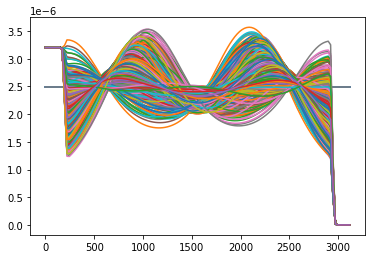

In [40]:
for x in range(875):
  plt.plot(sld_arr[x][0], sld_arr[x][1])
plt.show()

In [41]:
x_val=sld_arr[:,0,:]
x_min = x_val.min()
x_max = x_val.max()
print('x-range = ', x_min, ' to ',x_max)
y_val=sld_arr[:,1,:]
y_min = y_val.min()
y_max = y_val.max()
print('y-range = ', y_min, ' to ',y_max)

x-range =  0.0  to  3119.78
y-range =  8.28593e-16  to  3.56855e-06


In [42]:
#Normalize
sld_arr[:,0,:] = (sld_arr[:,0,:] - x_min)/(x_max - x_min)
sld_arr[:,1,:] = (sld_arr[:,1,:] - y_min)/(y_max - y_min)

In [43]:
sld_arr.max(), sld_arr.min()

(1.0, 0.0)

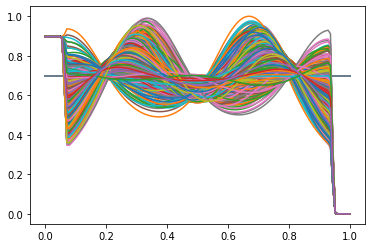

In [44]:
for x in range(875):
  plt.plot(sld_arr[x][0], sld_arr[x][1])
plt.show()

In [45]:
sld_arr.max(), sld_arr.min()

(1.0, 0.0)

In [46]:
import torch
import torchvision
from torchvision import transforms
from torch.utils.data import DataLoader,random_split, Dataset
from torch import nn
import torch.nn.functional as F
import torch.optim as optim

In [47]:
np.random.shuffle(sld_arr)

m=len(sld_arr)
# print(m-m*0.2)

ntrain_loader, nval = sld_arr[:int(m-m*0.2),:,:], sld_arr[int(m-m*0.2):,:]
m = len(nval)//2

# print(m1)
nval_loader, ntest_loader = nval[:int(m),:,:], nval[int(m):,:,:]


xtrain_dataset, x_temp = train_test_split(sld_arr, train_size=0.8)
xval_dataset, xtest_dataset = train_test_split(x_temp, test_size=0.5)
print(xtrain_dataset.shape, xval_dataset.shape, xtest_dataset.shape)

batch_size = 50

train_loader = torch.utils.data.DataLoader(torch.tensor(xtrain_dataset[:,np.newaxis,:,:]).float(), batch_size=batch_size)
valid_loader = torch.utils.data.DataLoader(torch.tensor(xval_dataset[:,np.newaxis,:,:]).float(), batch_size=batch_size)
test_loader = torch.utils.data.DataLoader(torch.tensor(xtest_dataset[:,np.newaxis,:,:]).float(), batch_size=batch_size)

# ytrain_loader = torch.utils.data.DataLoader(torch.tensor(ytrain_dataset).float(), batch_size=batch_size)
# yvalid_loader = torch.utils.data.DataLoader(torch.tensor(yval_dataset).float(), batch_size=batch_size)
# ytest_loader = torch.utils.data.DataLoader(torch.tensor(ytest_dataset).float(), batch_size=batch_size)

(700, 2, 128) (87, 2, 128) (88, 2, 128)


In [48]:
# from google.colab import drive
# drive.mount('/content/gdrive/')

In [49]:
# !cp /content/gdrive/MyDrive/Pytorch-tools-gdrive/neutron_refl_autoencoder.py .

In [50]:
# import neutron_refl_autoencoder as LA

In [51]:
class LAutoencoder(nn.Module):
    
    def __init__(self,encoded_space_dim,dim1,dim2):
        super().__init__()
        
        self.encoder = nn.Sequential(
            nn.Linear(dim1 * dim2, 500),
            nn.ReLU(True),
            nn.Linear(500, 500),
            nn.ReLU(True),
            nn.Linear(500,encoded_space_dim))
        self.decoder = nn.Sequential(
            nn.Linear(encoded_space_dim, 500),
            nn.ReLU(True),
            nn.Linear(500, 500),
            nn.ReLU(True),
            nn.Linear(500, dim1 * dim2))
        
    def forward(self, x):
            latent = self.encoder(x)
            x = self.decoder(latent)
            return x,latent


In [52]:
### Training function
def train_epoch(model, device, dataloader, loss_fn, optimizer):
    # Set train mode for both the encoder and the decoder
    model.train()
    # decoder.train()
    train_loss = []
    # Iterate the dataloader (we do not need the label values, this is unsupervised learning)
    for data in dataloader: # with "_" we just ignore the labels (the second element of the dataloader tuple)
        # Move tensor to the proper device
        img = data
        img = img.view(img.size(0), -1).to(device)  
        # Encode and Decode data
        output,latent = model(img)
        loss = loss_fn(output, img)
        # Backward pass
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        # Print batch loss
        # print('\t train loss per batch: %f' % (loss.data))
        train_loss.append(loss.detach().cpu().numpy())

    return np.mean(train_loss)

In [53]:
### Testing function
def test_epoch(model, device, dataloader, loss_fn):
    # Set evaluation mode for encoder and decoder
    model.eval()
    # decoder.eval()
    with torch.no_grad(): # No need to track the gradients
        # Define the lists to store the outputs for each batch
        conc_out = []
        conc_label = []
        for  data in dataloader:
            img = data
            img = img.view(img.size(0), -1).to(device) 
            # Encode and Decode data
            output, latent = model(img)
            # Append the network output and the original image to the lists
            conc_out.append(output.cpu())
            conc_label.append(img.cpu())
        # Create a single tensor with all the values in the lists
        conc_out = torch.cat(conc_out)
        conc_label = torch.cat(conc_label) 
        # Evaluate global loss
        val_loss = loss_fn(conc_out, conc_label)
    return val_loss.data

In [54]:
def plot_ae_outputs(model,dataset,device,n=10):
    torch_dataset = torch.tensor(dataset[:,np.newaxis,:,:]).float()
    plt.figure(figsize=(26,5.5))
    # targets = test_dataset.targets.numpy()
    # t_idx = {i:np.where(targets==i)[0][0] for i in range(n)}
    for i in range(10):
      ax = plt.subplot(2,n,i+1)
      img = torch_dataset[i]
      # print(img.shape)
      img = img.view(img.size(0), -1).to(device) 
      # print(img.shape)
      model.eval().to(device)
      with torch.no_grad():
         rec_img,_  = model(img)
        #  print("pepe",img.shape,rec_img.shape)
      # plt.plot(img.cpu().reshape(28,28).numpy(), cmap='gist_gray')
      plt.plot(img.cpu().reshape(2,128).numpy()[0],img.cpu().reshape(2,128).numpy()[1])
      # ax.get_xaxis().set_visible(False)
      # ax.get_yaxis().set_visible(False)  
      if i == n//2:
        ax.set_title('Original images')
      ax = plt.subplot(2, n, i + 1 + n)
      # plt.imshow(rec_img.cpu().reshape(28,28).numpy(), cmap='gist_gray')  
      plt.plot(rec_img.cpu().reshape(2,128).numpy()[0],rec_img.cpu().reshape(2,128).numpy()[1])
      # ax.get_xaxis().set_visible(False)
      # ax.get_yaxis().set_visible(False)  
      if i == n//2:
         ax.set_title('Reconstructed images')
    plt.show()  

In [55]:
### Define the loss function
loss_fn = torch.nn.MSELoss()

### Define an optimizer (both for the encoder and the decoder!)
lr= 0.001

### Set the random seed for reproducible results
torch.manual_seed(0)

### Initialize the two networks
d = 3
in_d1 = 2
in_d2 = 128

#model = Autoencoder(encoded_space_dim=encoded_space_dim)
model = LAutoencoder(encoded_space_dim=d,dim1=in_d1,dim2=in_d2)
params_to_optimize = [
    {'params': model.parameters()}
]

optim = torch.optim.Adam(params_to_optimize, lr=lr, weight_decay=1e-05)

# Check if the GPU is available
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Selected device: {device}')
# Move both the encoder and the decoder to the selected device
model.to(device)

Selected device: cpu


LAutoencoder(
  (encoder): Sequential(
    (0): Linear(in_features=256, out_features=500, bias=True)
    (1): ReLU(inplace=True)
    (2): Linear(in_features=500, out_features=500, bias=True)
    (3): ReLU(inplace=True)
    (4): Linear(in_features=500, out_features=3, bias=True)
  )
  (decoder): Sequential(
    (0): Linear(in_features=3, out_features=500, bias=True)
    (1): ReLU(inplace=True)
    (2): Linear(in_features=500, out_features=500, bias=True)
    (3): ReLU(inplace=True)
    (4): Linear(in_features=500, out_features=256, bias=True)
  )
)

EPOCH 1/100 	 train loss 0.10010462254285812 	 val loss 0.014000266790390015


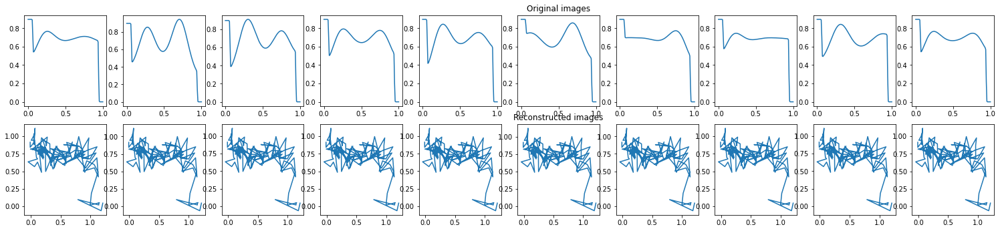

EPOCH 2/100 	 train loss 0.005292537156492472 	 val loss 0.0028901135083287954


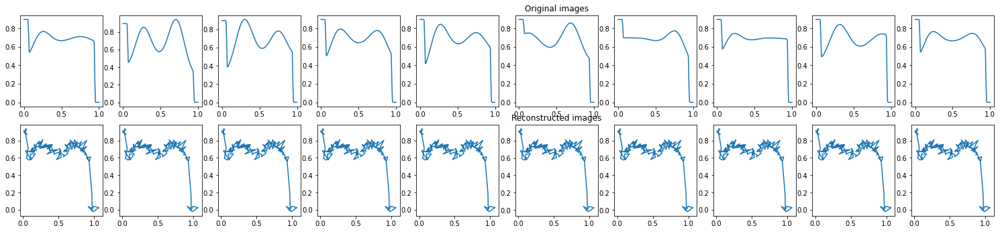

EPOCH 3/100 	 train loss 0.0021255400497466326 	 val loss 0.0019295833772048354


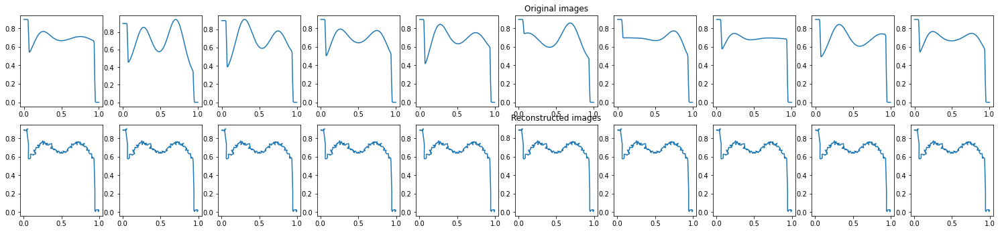

EPOCH 4/100 	 train loss 0.0016965745016932487 	 val loss 0.001802746788598597


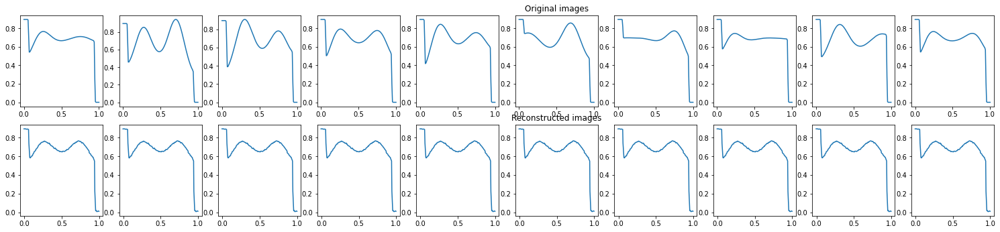

EPOCH 5/100 	 train loss 0.0016563499812036753 	 val loss 0.0017862789100036025


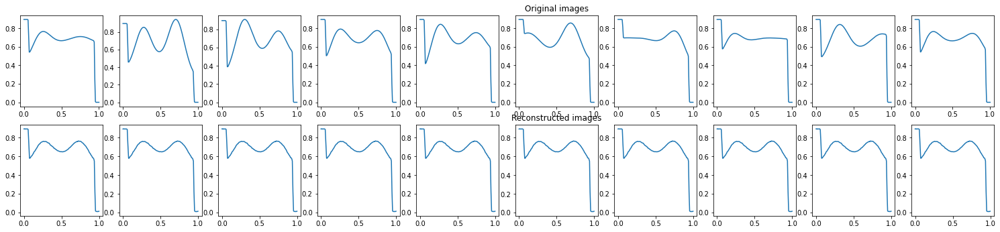

EPOCH 6/100 	 train loss 0.0016477133613079786 	 val loss 0.0017857318744063377


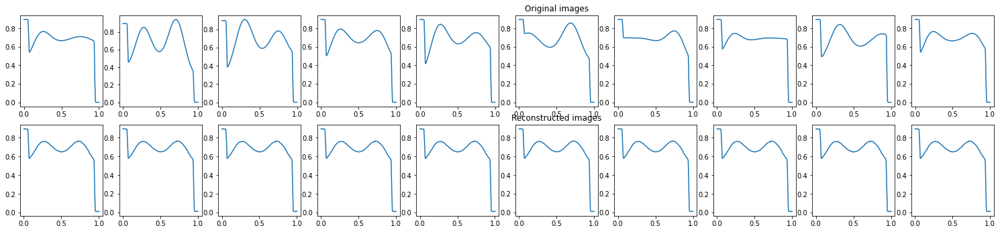

EPOCH 7/100 	 train loss 0.0016456134617328644 	 val loss 0.0017853656318038702


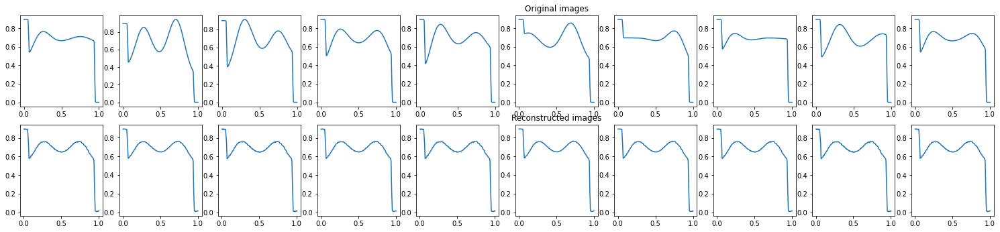

EPOCH 8/100 	 train loss 0.001640748931095004 	 val loss 0.0017847178969532251


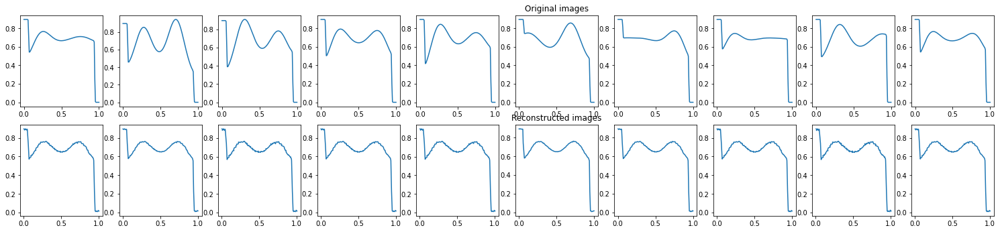

EPOCH 9/100 	 train loss 0.0016201721737161279 	 val loss 0.0017578169936314225


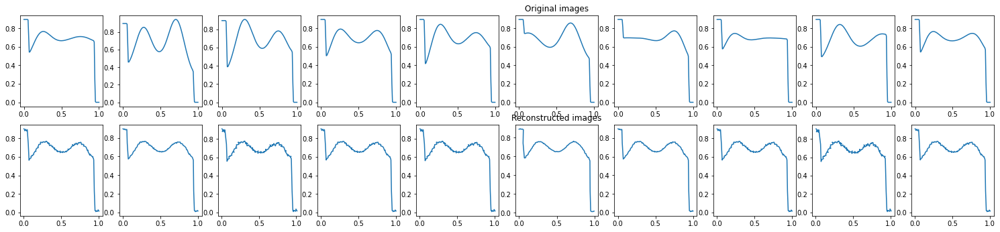

EPOCH 10/100 	 train loss 0.0015181999187916517 	 val loss 0.0014986458700150251


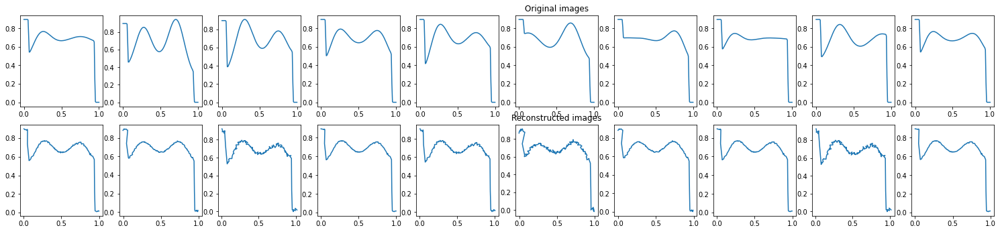

EPOCH 11/100 	 train loss 0.0011963974684476852 	 val loss 0.0009612725116312504


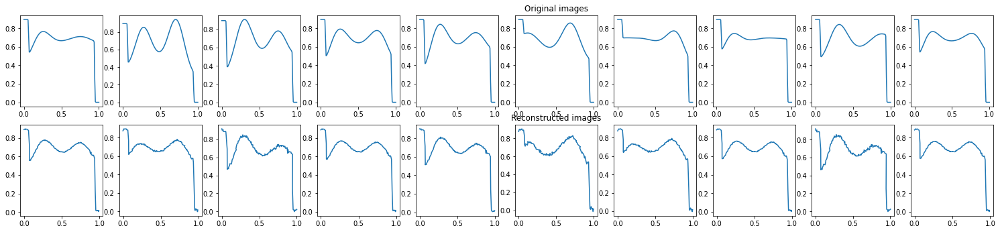

EPOCH 12/100 	 train loss 0.000943864812143147 	 val loss 0.0008937590755522251


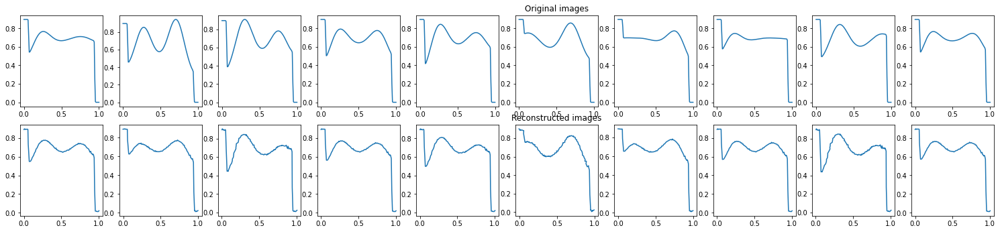

EPOCH 13/100 	 train loss 0.0008554242667742074 	 val loss 0.0009103931952267885


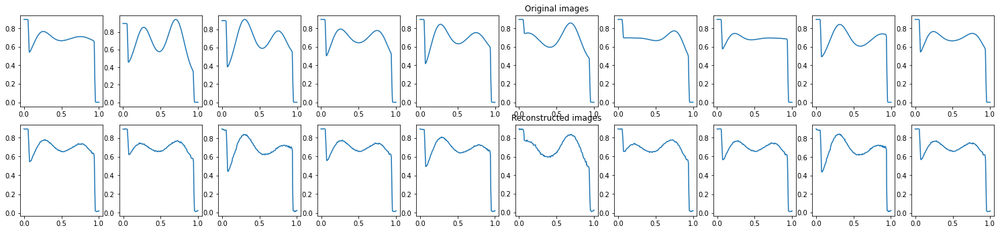

EPOCH 14/100 	 train loss 0.0008164516766555607 	 val loss 0.0008658061851747334


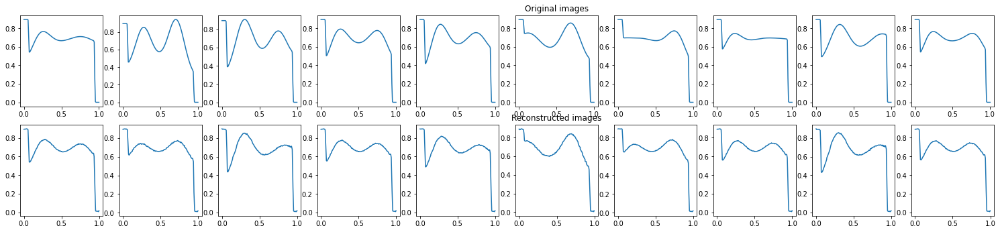

EPOCH 15/100 	 train loss 0.000817862048279494 	 val loss 0.0008855120977386832


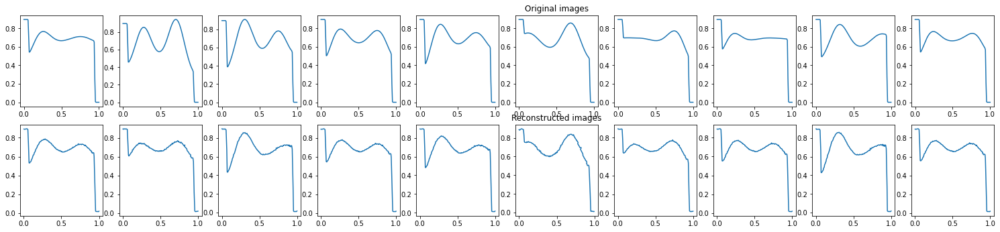

EPOCH 16/100 	 train loss 0.0008082845015451312 	 val loss 0.000831847544759512


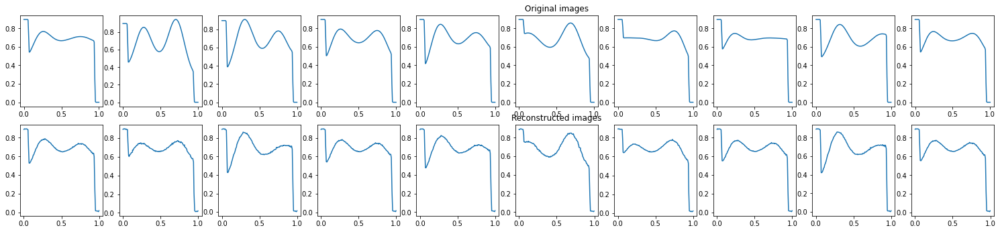

EPOCH 17/100 	 train loss 0.0007872679270803928 	 val loss 0.000801272748503834


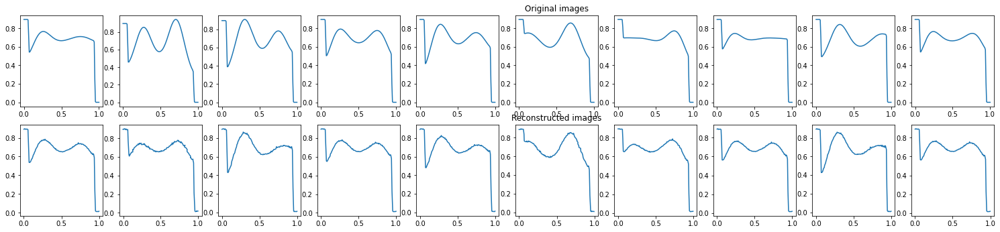

EPOCH 18/100 	 train loss 0.0007762524182908237 	 val loss 0.0007916420581750572


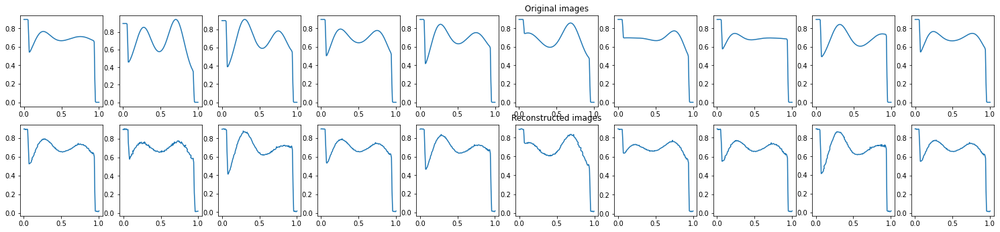

EPOCH 19/100 	 train loss 0.0007289334898814559 	 val loss 0.000696376315318048


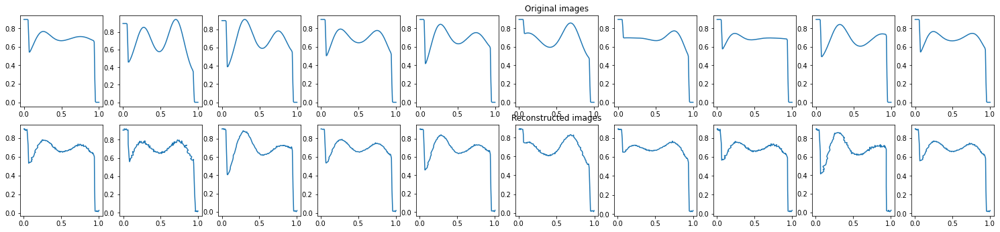

EPOCH 20/100 	 train loss 0.0005962424329482019 	 val loss 0.0004934744210913777


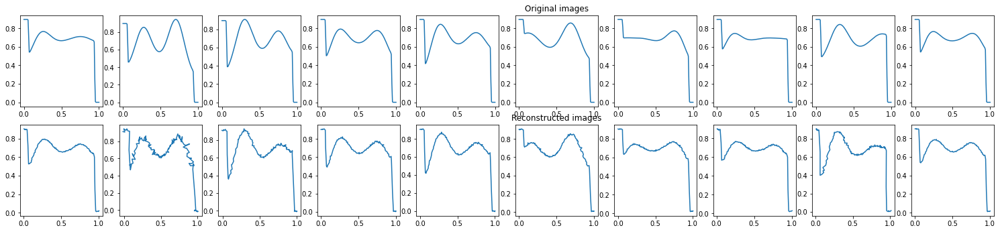

EPOCH 21/100 	 train loss 0.0004468275874387473 	 val loss 0.0003724516136571765


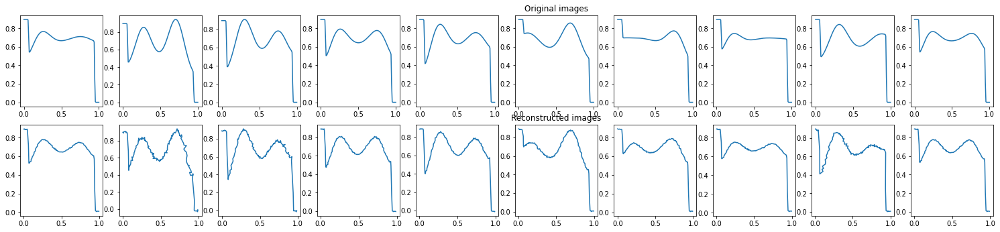

EPOCH 22/100 	 train loss 0.0002987370826303959 	 val loss 0.00019660386897157878


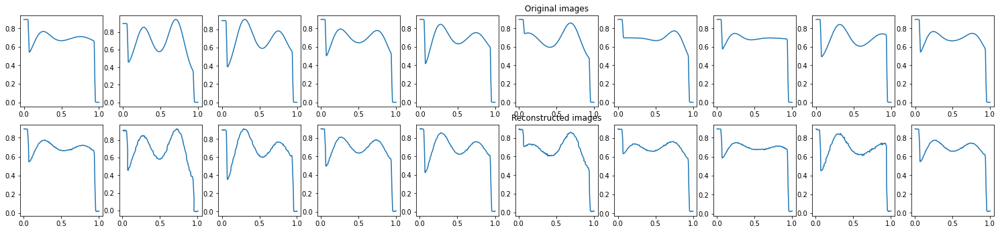

EPOCH 23/100 	 train loss 0.00020194925309624523 	 val loss 0.00014479784294962883


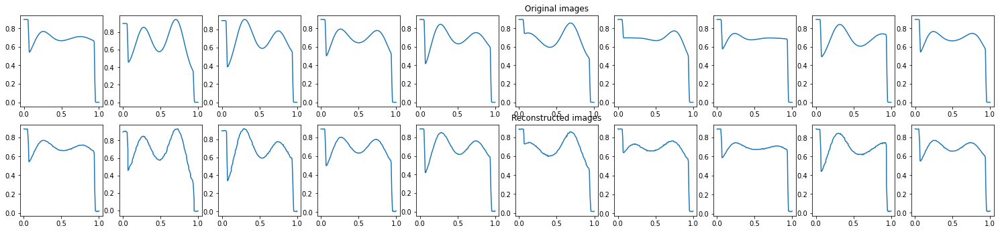

EPOCH 24/100 	 train loss 0.0001829272514441982 	 val loss 0.00012904763570986688


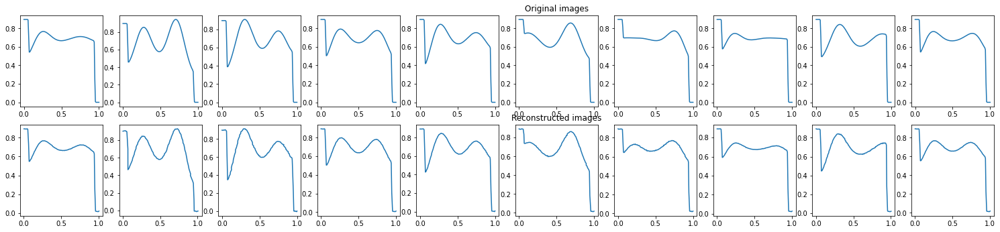

EPOCH 25/100 	 train loss 0.00017788626428227872 	 val loss 0.0001230390917044133


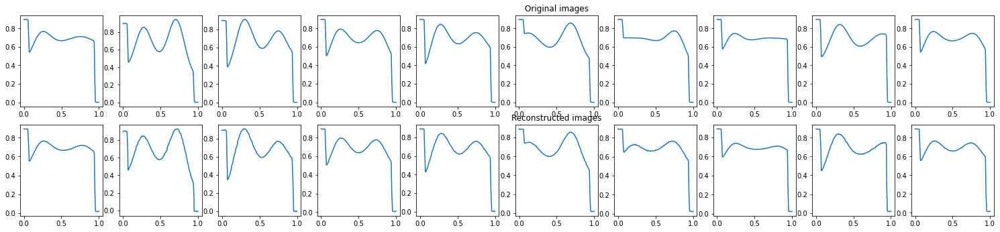

EPOCH 26/100 	 train loss 0.0001730116637190804 	 val loss 0.0001221308921230957


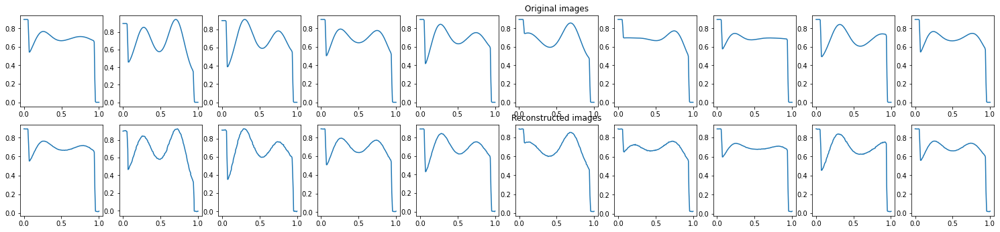

EPOCH 27/100 	 train loss 0.00016988228890113533 	 val loss 0.00011741281923605129


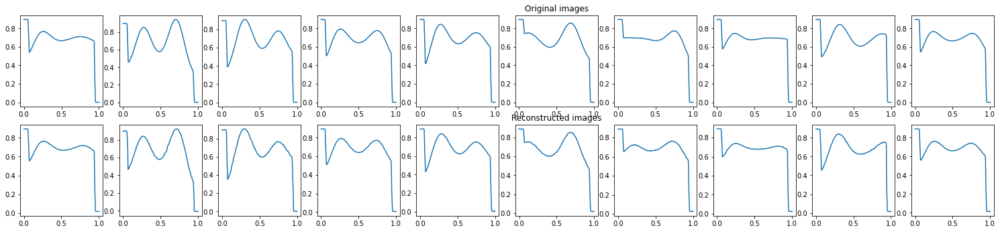

EPOCH 28/100 	 train loss 0.0001669318589847535 	 val loss 0.00011672446999000385


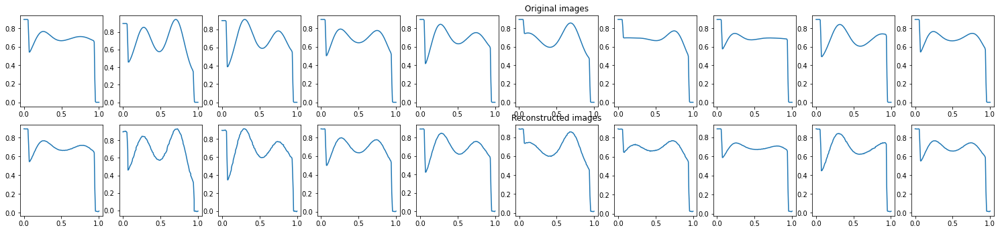

EPOCH 29/100 	 train loss 0.00016444666835013777 	 val loss 0.0001086207848857157


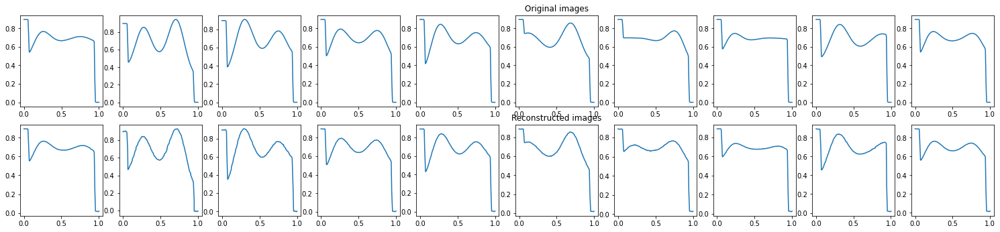

EPOCH 30/100 	 train loss 0.00016172575124073774 	 val loss 0.00011019915109500289


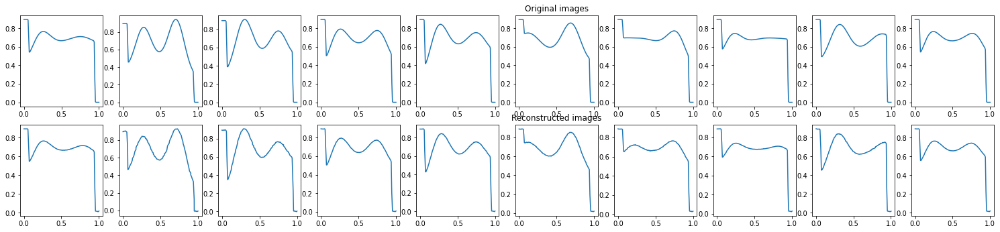

EPOCH 31/100 	 train loss 0.00015944319602567703 	 val loss 0.0001051583094522357


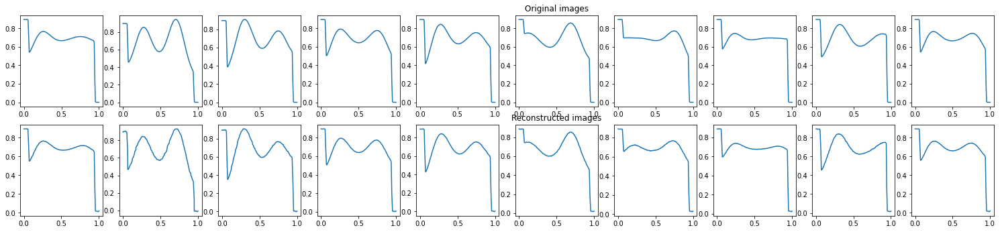

EPOCH 32/100 	 train loss 0.00015731455641798675 	 val loss 0.00010329690121579915


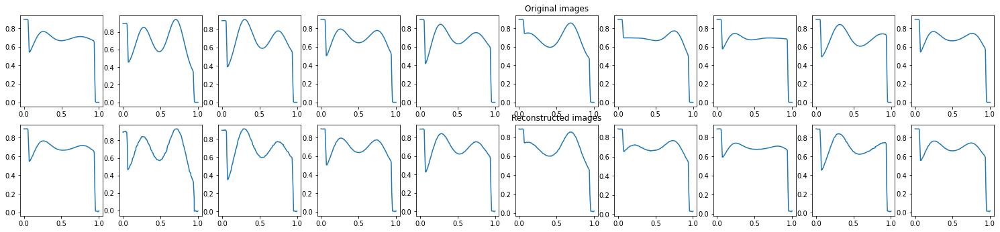

EPOCH 33/100 	 train loss 0.00015628826804459095 	 val loss 0.00010552081948844716


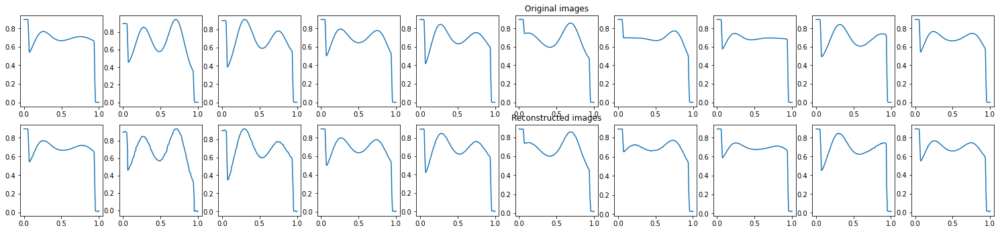

EPOCH 34/100 	 train loss 0.0001561888784635812 	 val loss 0.00010467935499036685


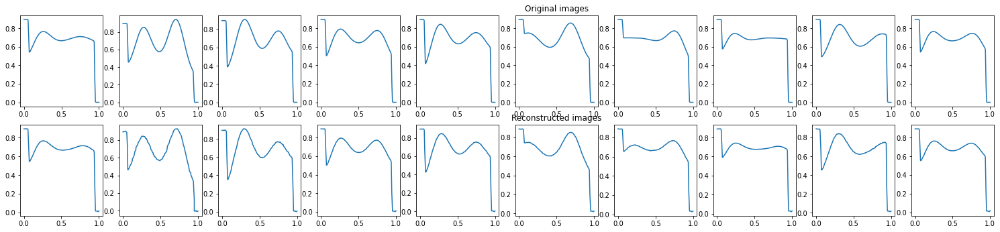

EPOCH 35/100 	 train loss 0.00015379860997200012 	 val loss 0.00010314058454241604


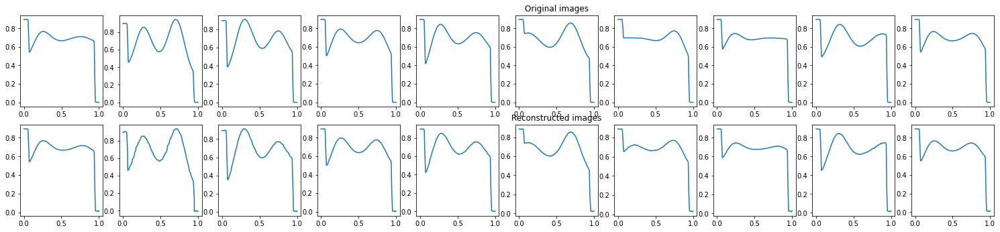

EPOCH 36/100 	 train loss 0.0001525763946119696 	 val loss 0.00010298339475411922


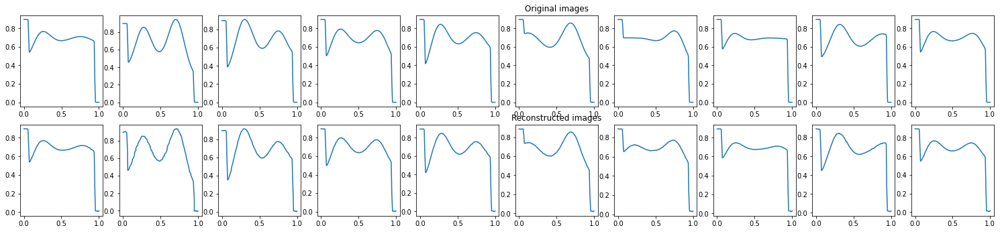

EPOCH 37/100 	 train loss 0.00015185923257377 	 val loss 0.00010759138240246102


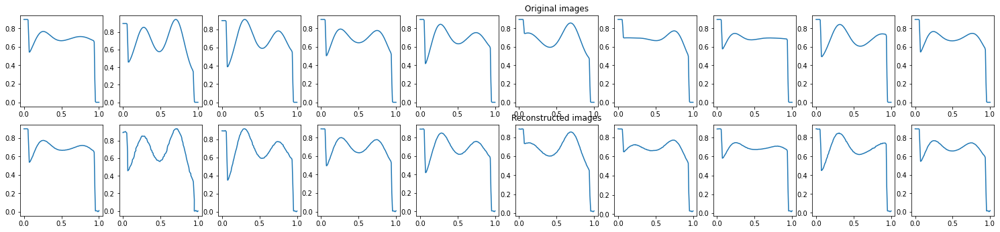

EPOCH 38/100 	 train loss 0.0001565290876897052 	 val loss 0.00010128382564289495


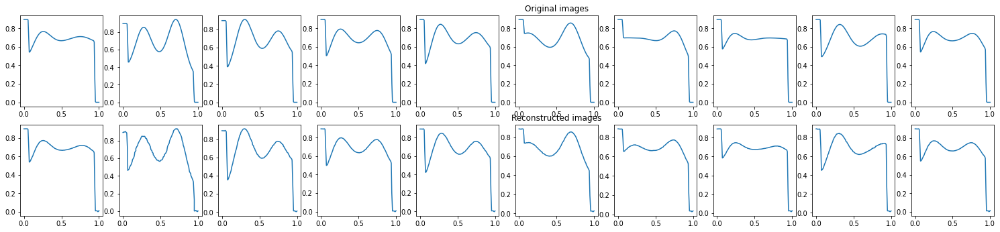

EPOCH 39/100 	 train loss 0.00014996207028161734 	 val loss 0.00010083684173878282


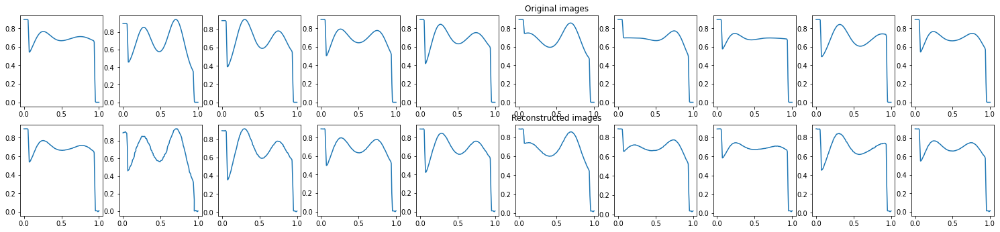

EPOCH 40/100 	 train loss 0.00014954441576264799 	 val loss 0.00010585667041596025


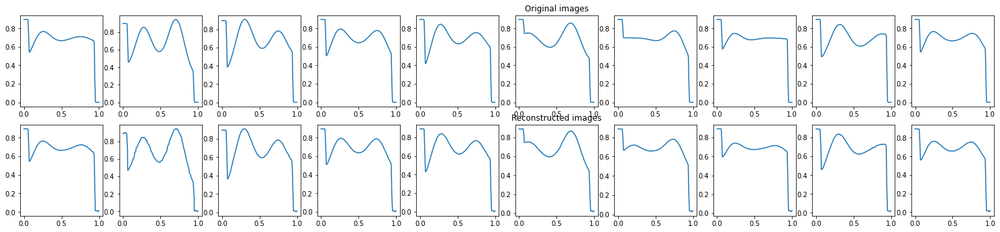

EPOCH 41/100 	 train loss 0.00014886110147926956 	 val loss 9.720440721139312e-05


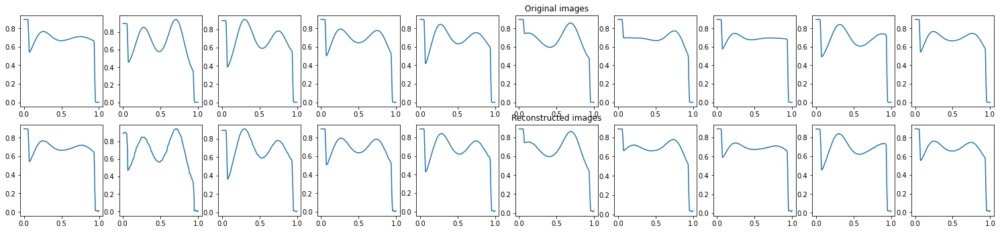

EPOCH 42/100 	 train loss 0.00014265533536672592 	 val loss 0.00010523181117605418


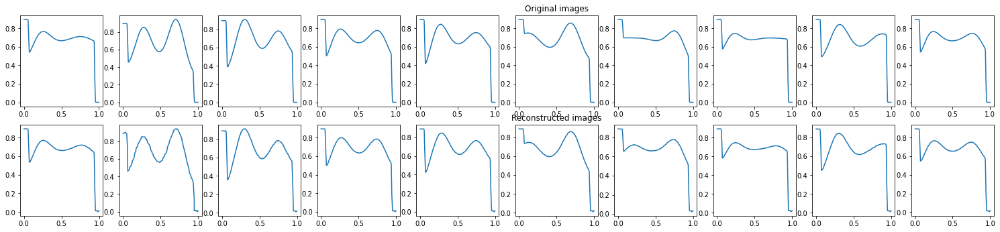

EPOCH 43/100 	 train loss 0.00014723661297466606 	 val loss 0.00010431903501739725


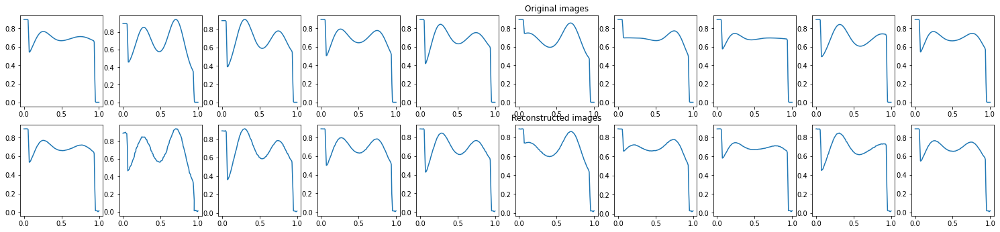

EPOCH 44/100 	 train loss 0.00013730116188526154 	 val loss 8.97112549864687e-05


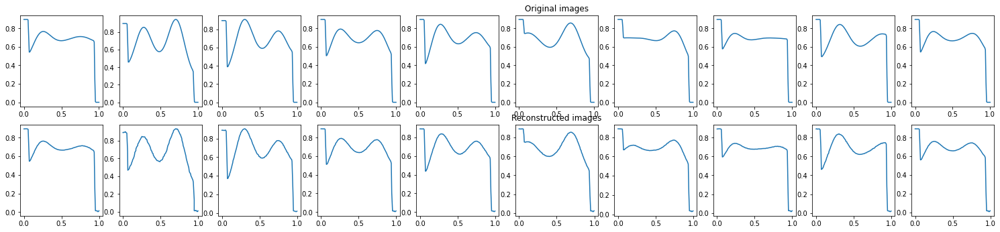

EPOCH 45/100 	 train loss 0.00012919424625579268 	 val loss 9.073459659703076e-05


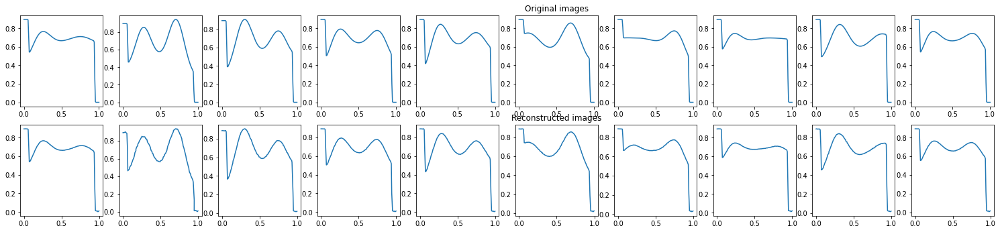

EPOCH 46/100 	 train loss 0.00012529223749879748 	 val loss 9.764717106008902e-05


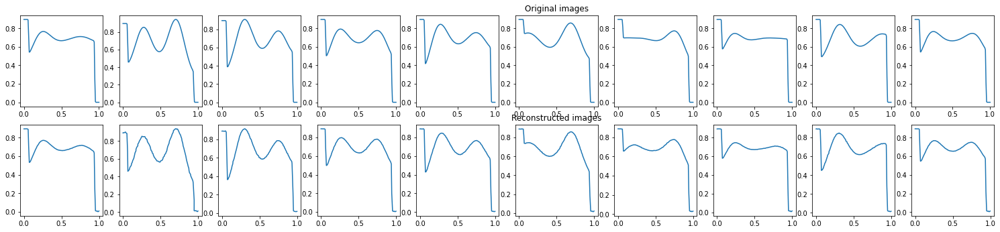

EPOCH 47/100 	 train loss 0.000126231592730619 	 val loss 9.048232459463179e-05


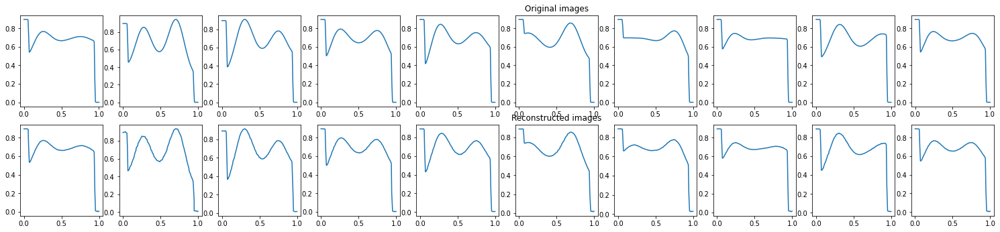

EPOCH 48/100 	 train loss 0.0001294595713261515 	 val loss 9.274628246203065e-05


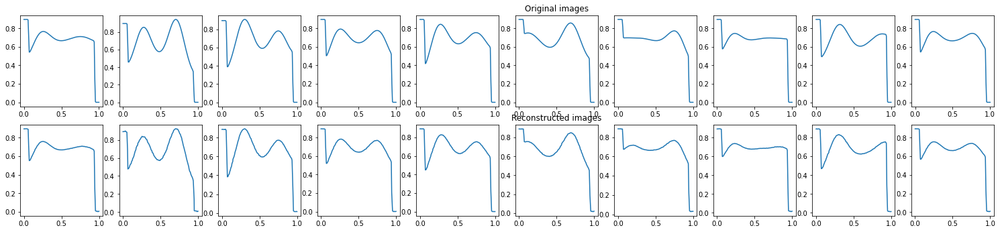

EPOCH 49/100 	 train loss 0.000115373739390634 	 val loss 9.013532690005377e-05


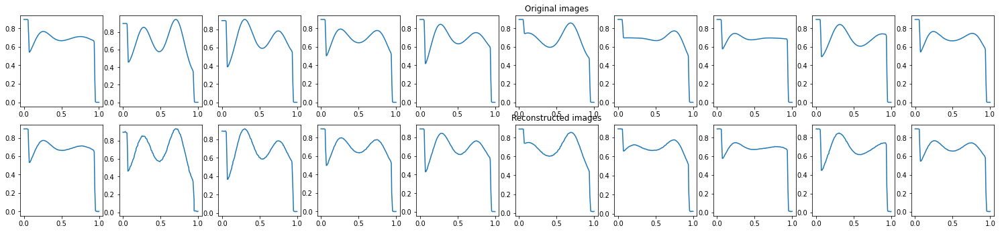

EPOCH 50/100 	 train loss 0.00010648502939147875 	 val loss 8.336581231560558e-05


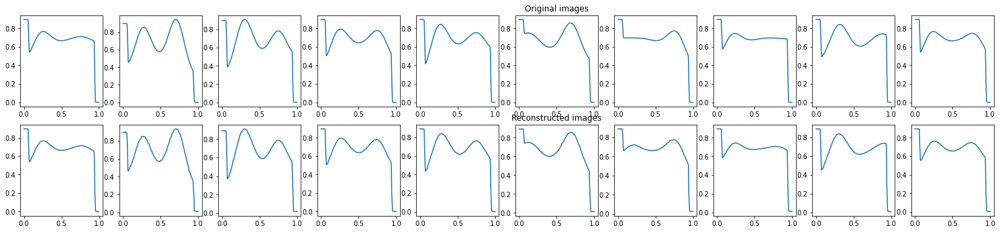

EPOCH 51/100 	 train loss 0.00010266889148624614 	 val loss 8.729104592930526e-05


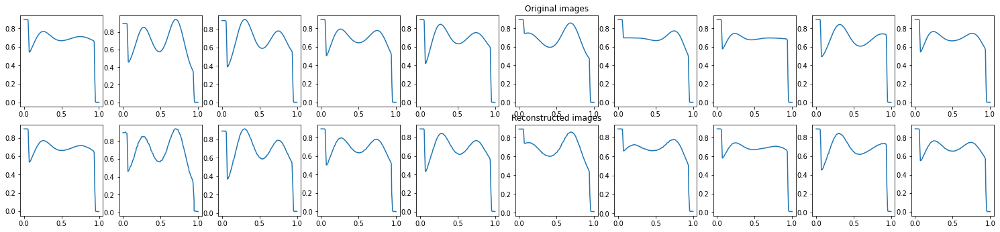

EPOCH 52/100 	 train loss 9.976881119655445e-05 	 val loss 8.330007403856143e-05


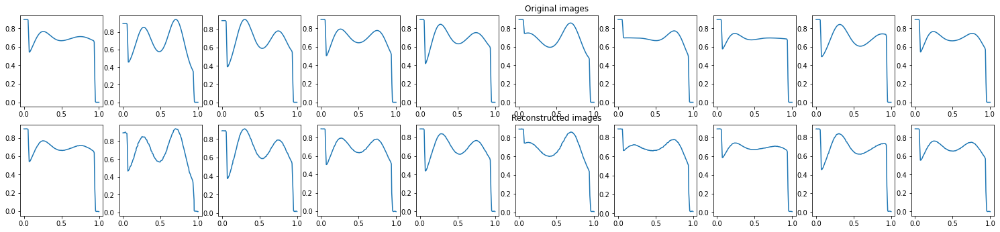

EPOCH 53/100 	 train loss 9.303555998485535e-05 	 val loss 8.085818262770772e-05


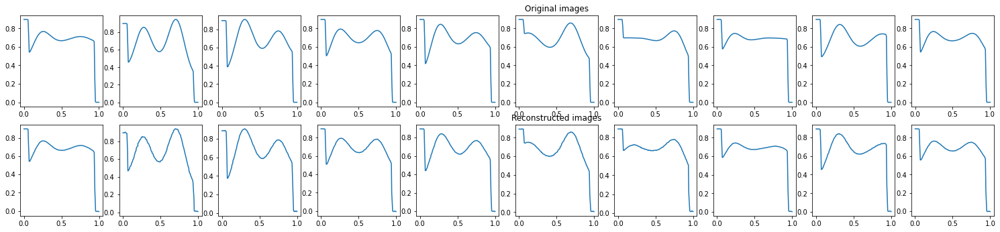

EPOCH 54/100 	 train loss 9.224854875355959e-05 	 val loss 8.70718649821356e-05


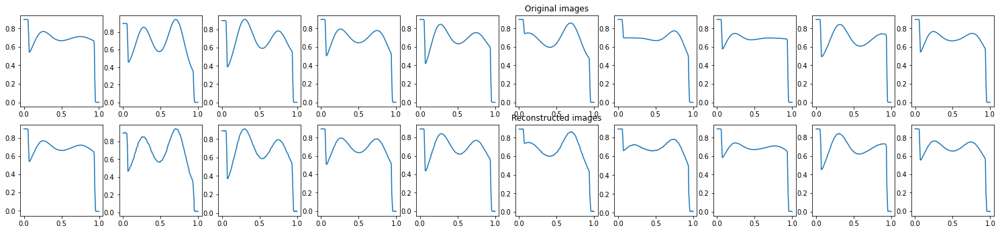

EPOCH 55/100 	 train loss 9.53358321567066e-05 	 val loss 7.907392136985436e-05


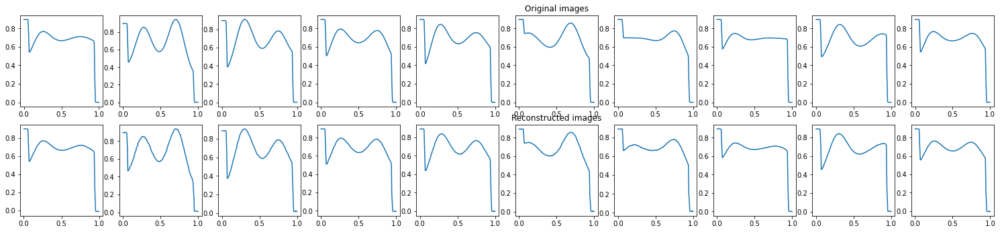

EPOCH 56/100 	 train loss 8.475793583784252e-05 	 val loss 8.580245776101947e-05


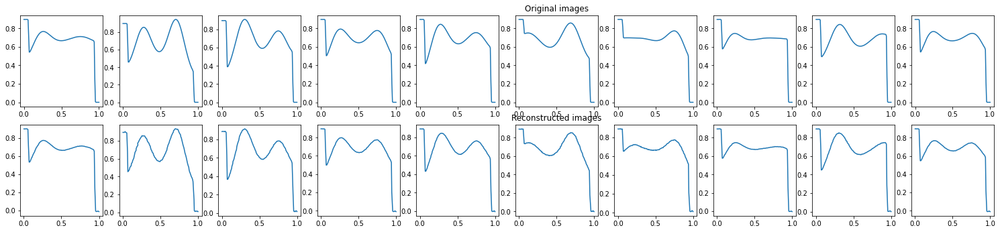

EPOCH 57/100 	 train loss 7.737319538136944e-05 	 val loss 7.915154128568247e-05


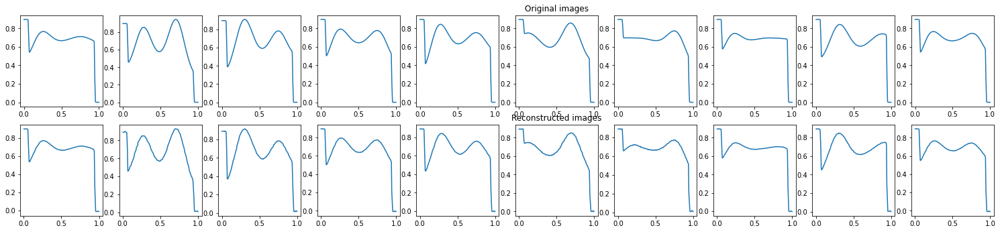

EPOCH 58/100 	 train loss 8.487507147947326e-05 	 val loss 8.241782779805362e-05


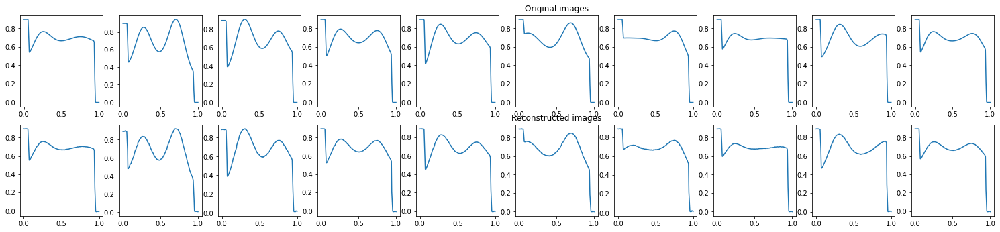

EPOCH 59/100 	 train loss 6.558365566888824e-05 	 val loss 7.399560126941651e-05


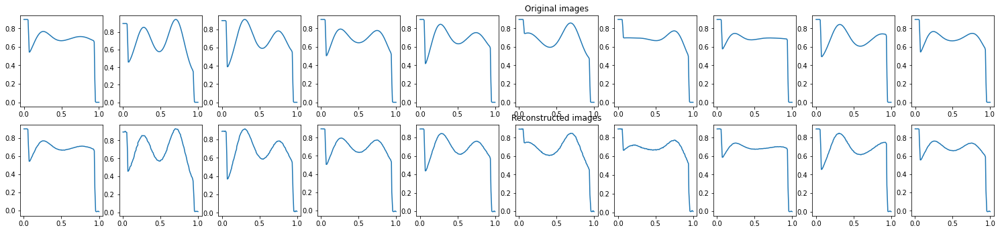

EPOCH 60/100 	 train loss 6.378386751748621e-05 	 val loss 6.520489841932431e-05


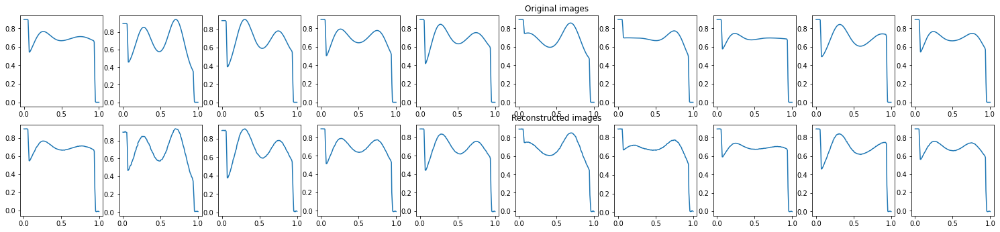

EPOCH 61/100 	 train loss 6.270215817494318e-05 	 val loss 7.174340862547979e-05


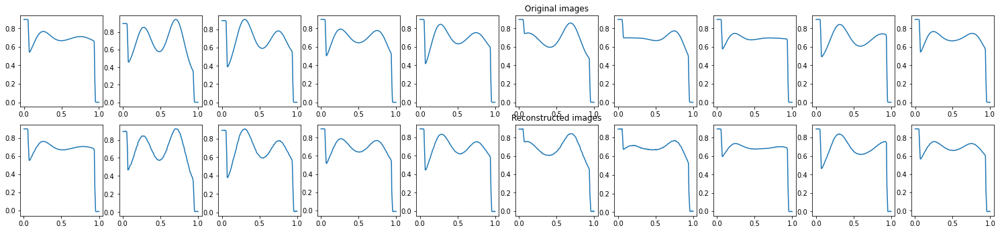

EPOCH 62/100 	 train loss 5.355364191927947e-05 	 val loss 6.844255403848365e-05


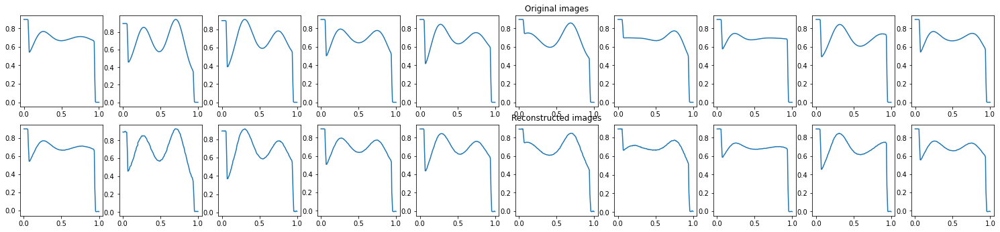

EPOCH 63/100 	 train loss 7.831965194782242e-05 	 val loss 7.439559703925624e-05


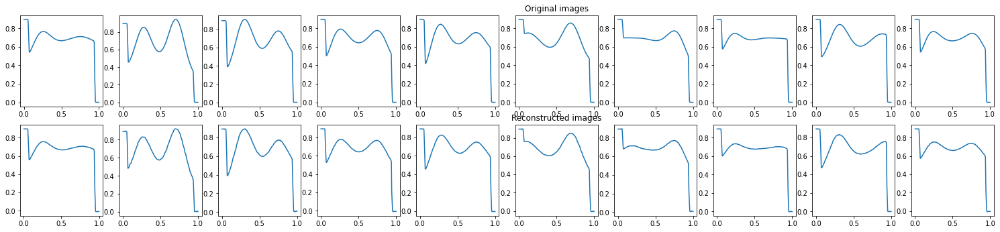

EPOCH 64/100 	 train loss 6.0846552514703944e-05 	 val loss 5.9773665270768106e-05


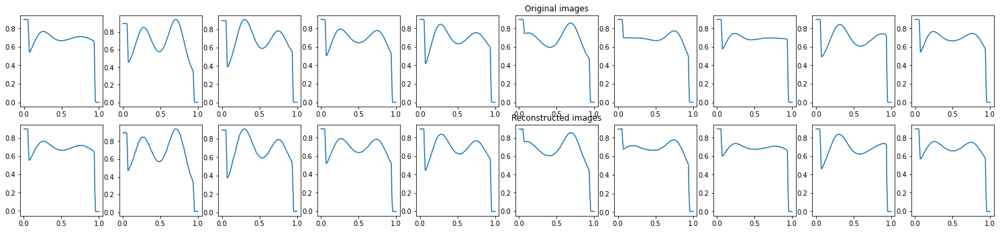

EPOCH 65/100 	 train loss 5.3309497161535546e-05 	 val loss 5.992341539240442e-05


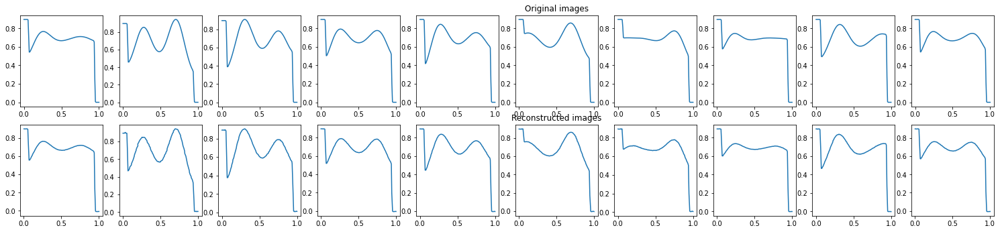

EPOCH 66/100 	 train loss 5.061565389041789e-05 	 val loss 6.241950177354738e-05


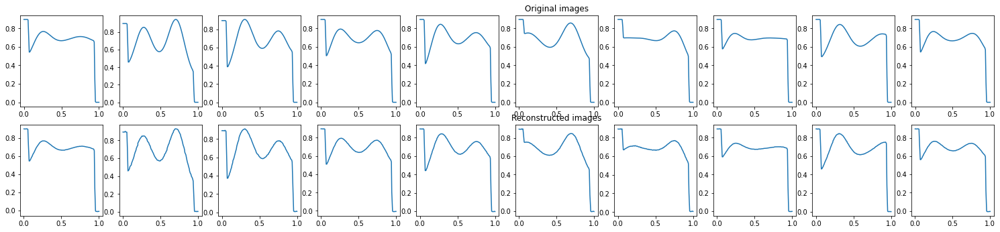

EPOCH 67/100 	 train loss 4.867743336944841e-05 	 val loss 6.0566373576875776e-05


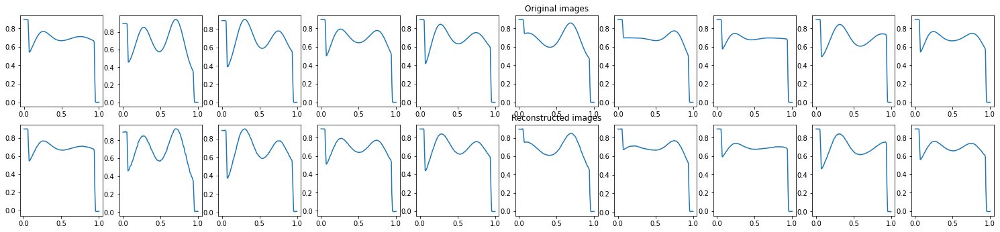

EPOCH 68/100 	 train loss 5.247763328952715e-05 	 val loss 8.730343688512221e-05


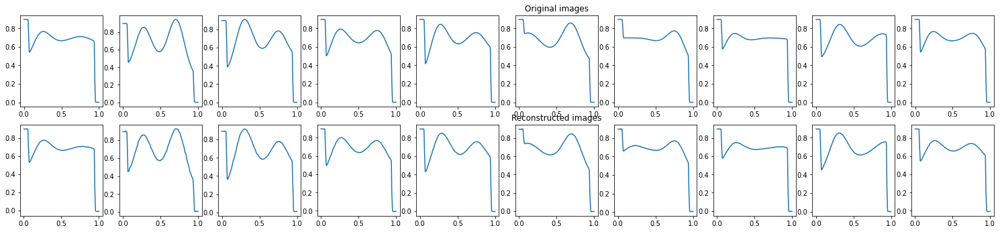

EPOCH 69/100 	 train loss 5.2428262279136106e-05 	 val loss 6.437702541006729e-05


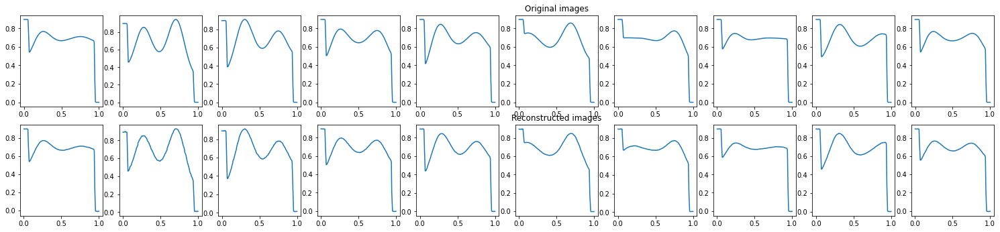

EPOCH 70/100 	 train loss 5.437287472886965e-05 	 val loss 6.2030871049501e-05


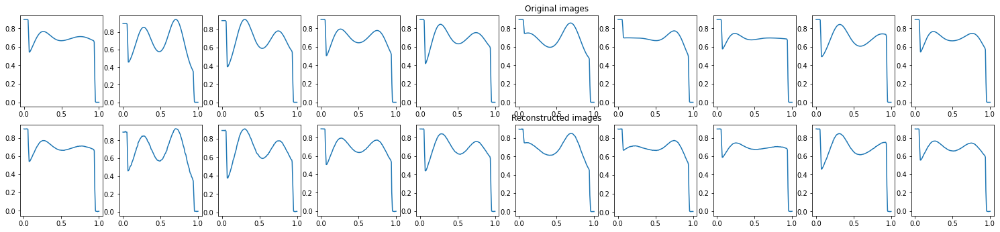

EPOCH 71/100 	 train loss 4.790950333699584e-05 	 val loss 5.5122516641858965e-05


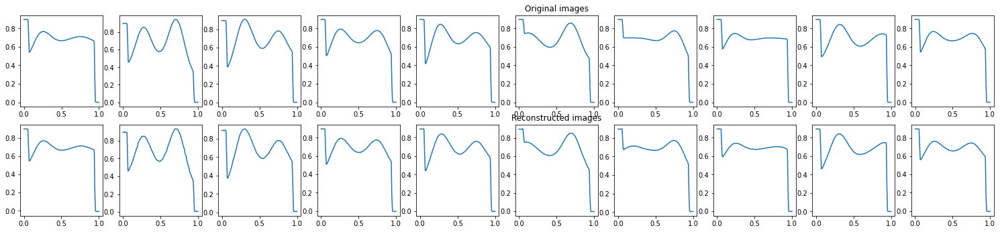

EPOCH 72/100 	 train loss 4.366769644548185e-05 	 val loss 6.7285836848896e-05


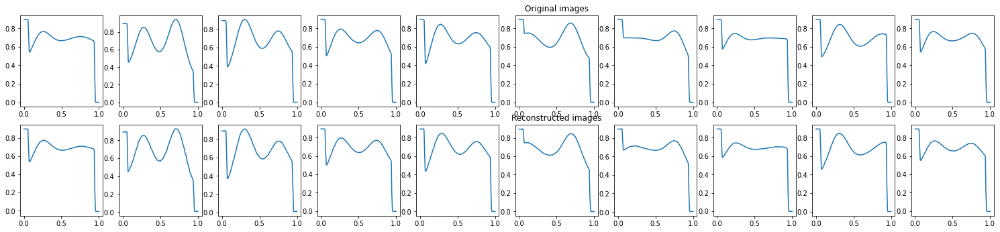

EPOCH 73/100 	 train loss 5.06534161104355e-05 	 val loss 6.444571044994518e-05


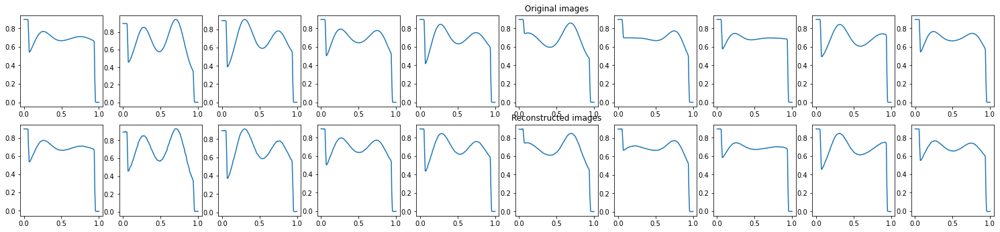

EPOCH 74/100 	 train loss 4.752293534693308e-05 	 val loss 6.30749054835178e-05


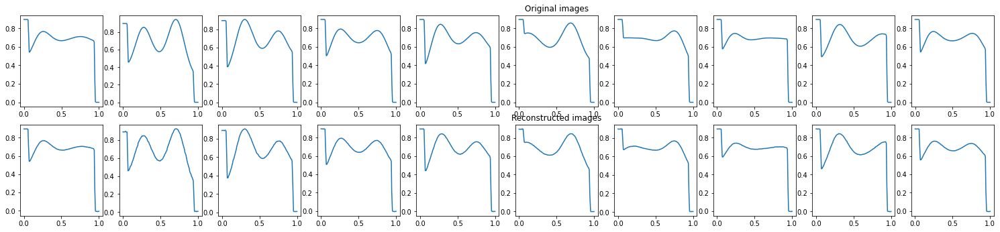

EPOCH 75/100 	 train loss 4.5690223487326875e-05 	 val loss 7.2330585680902e-05


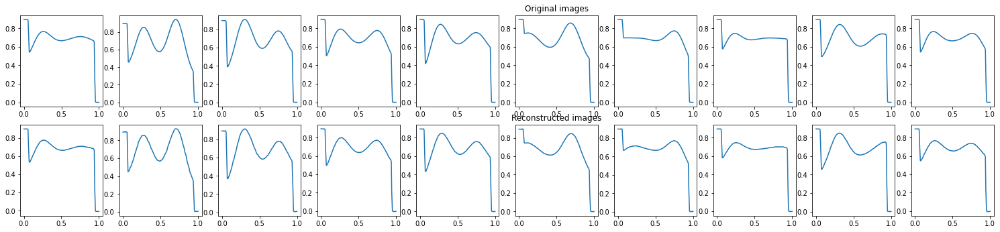

EPOCH 76/100 	 train loss 5.814285759697668e-05 	 val loss 5.3218358516460285e-05


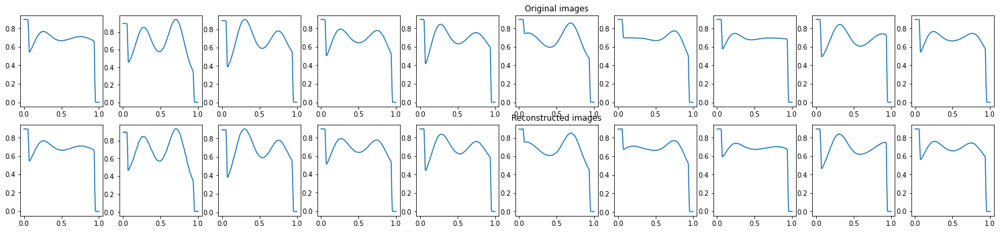

EPOCH 77/100 	 train loss 5.0107919378206134e-05 	 val loss 6.253243191167712e-05


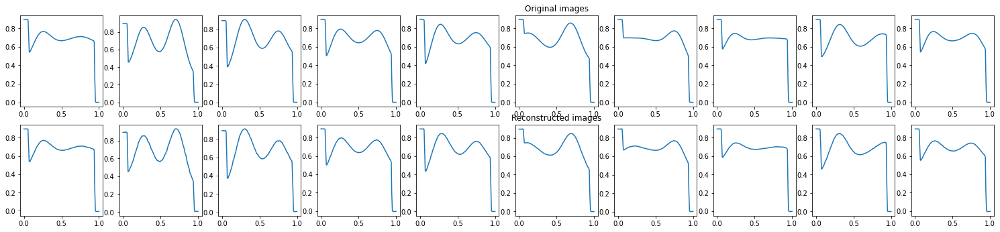

EPOCH 78/100 	 train loss 4.7128083679126576e-05 	 val loss 6.936718273209408e-05


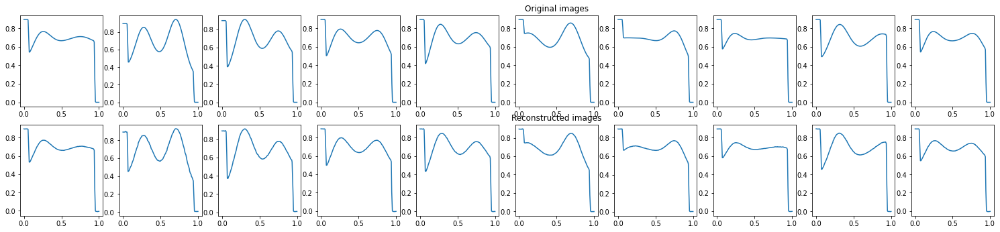

EPOCH 79/100 	 train loss 5.1202281611040235e-05 	 val loss 7.119974179659039e-05


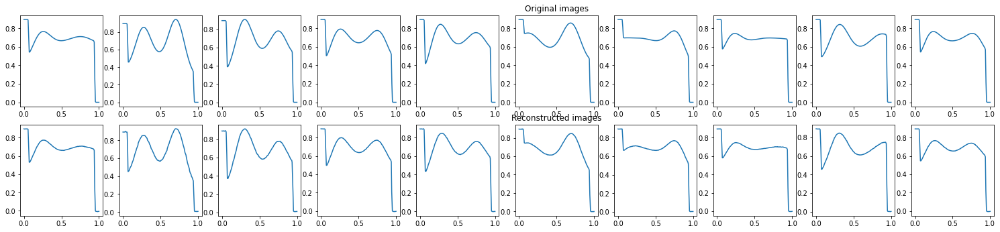

EPOCH 80/100 	 train loss 4.537704444373958e-05 	 val loss 5.6319327995879576e-05


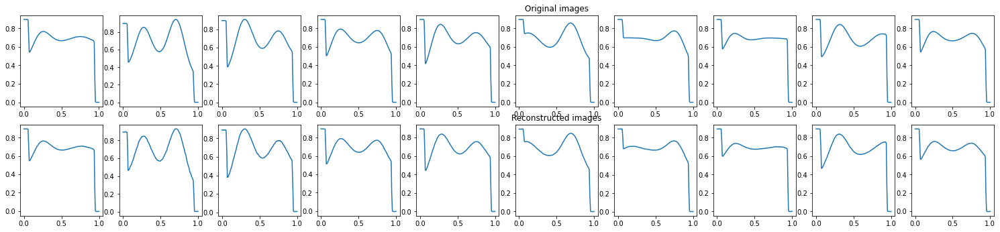

EPOCH 81/100 	 train loss 4.678824552684091e-05 	 val loss 6.053365359548479e-05


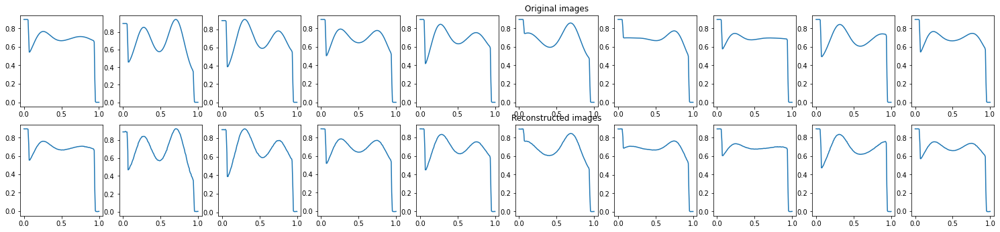

EPOCH 82/100 	 train loss 4.643061038223095e-05 	 val loss 5.451100514619611e-05


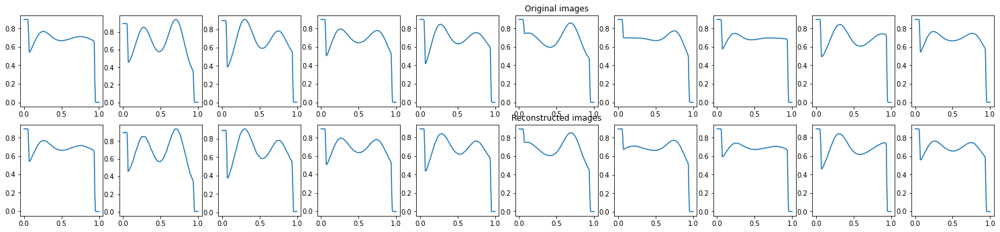

EPOCH 83/100 	 train loss 4.4681921281153336e-05 	 val loss 7.218779501272365e-05


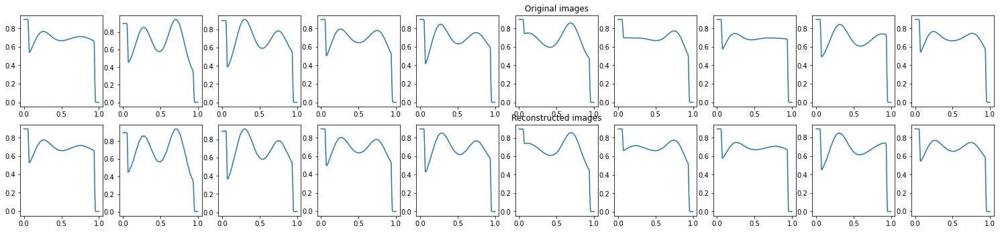

EPOCH 84/100 	 train loss 5.2186402172083035e-05 	 val loss 6.1028033087495714e-05


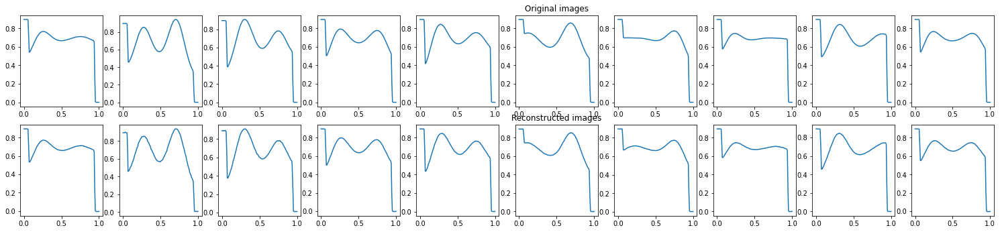

EPOCH 85/100 	 train loss 5.092311403132044e-05 	 val loss 7.656897651031613e-05


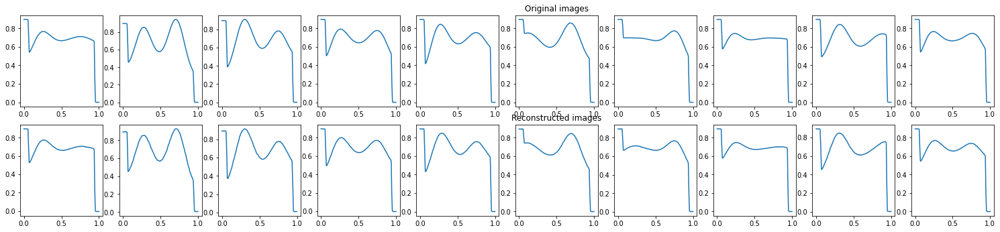

EPOCH 86/100 	 train loss 5.502158455783501e-05 	 val loss 9.489293006481603e-05


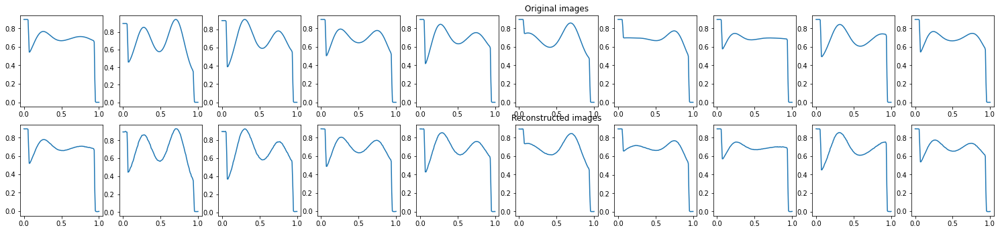

EPOCH 87/100 	 train loss 5.0286285841139033e-05 	 val loss 5.584812970482744e-05


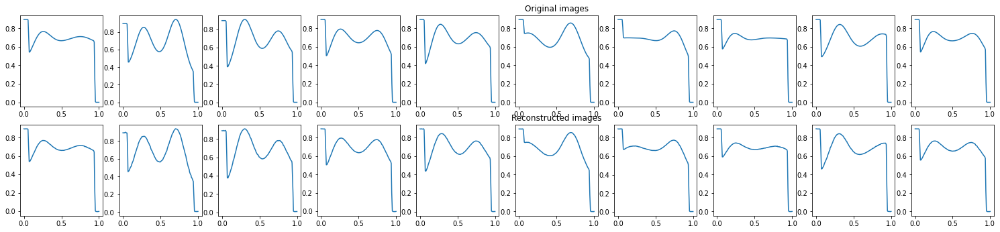

EPOCH 88/100 	 train loss 4.3272182665532455e-05 	 val loss 5.990751014905982e-05


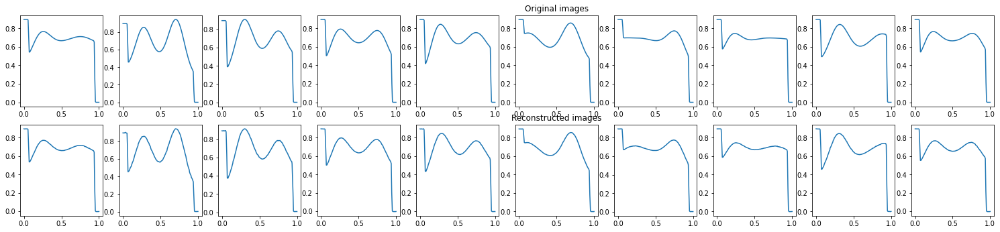

EPOCH 89/100 	 train loss 4.4781620090361685e-05 	 val loss 7.819548773113638e-05


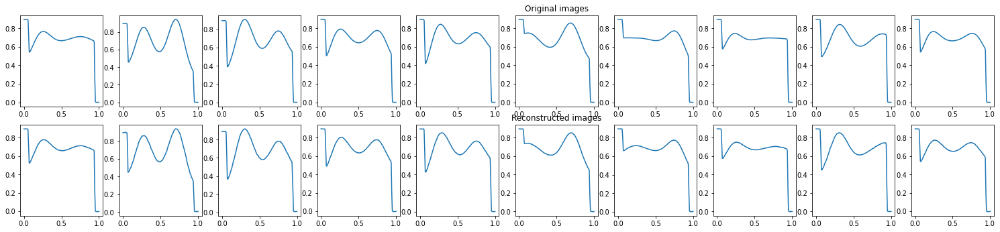

EPOCH 90/100 	 train loss 5.1037211960647255e-05 	 val loss 7.078576891217381e-05


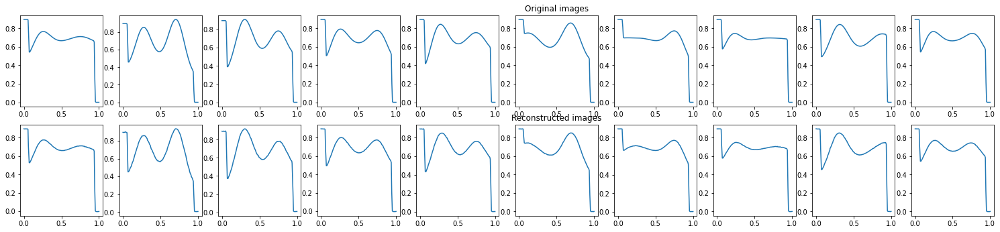

EPOCH 91/100 	 train loss 4.599104431690648e-05 	 val loss 6.7865927121602e-05


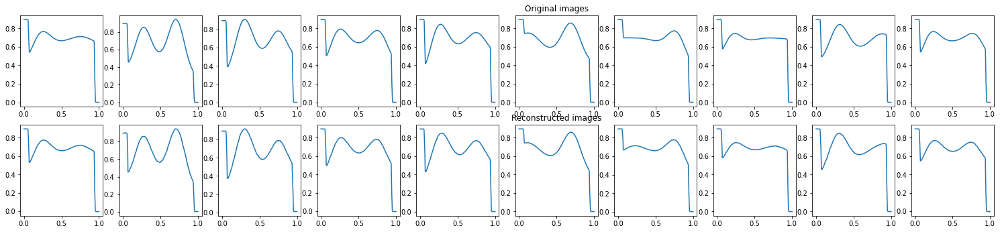

EPOCH 92/100 	 train loss 4.6289729652926326e-05 	 val loss 6.621101056225598e-05


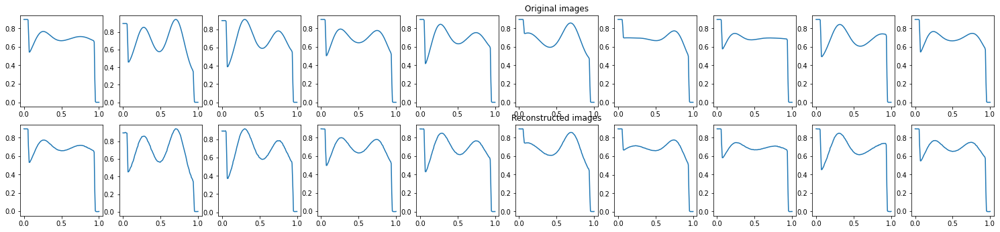

EPOCH 93/100 	 train loss 4.6334025682881474e-05 	 val loss 6.062856482458301e-05


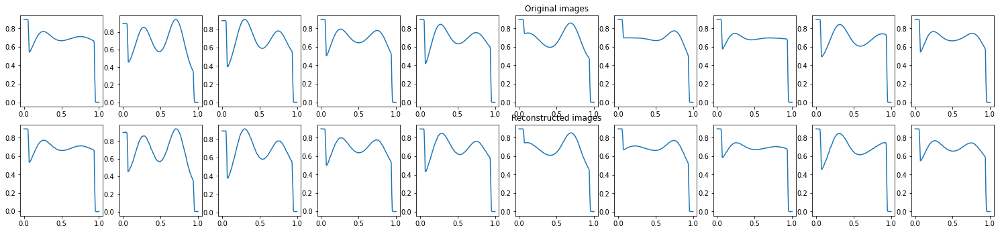

EPOCH 94/100 	 train loss 9.743702685227618e-05 	 val loss 0.0001509983849246055


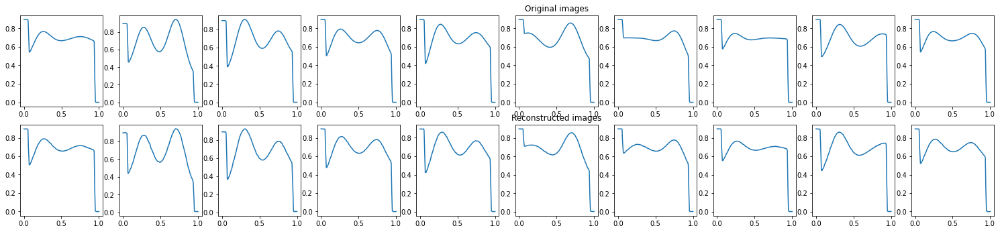

EPOCH 95/100 	 train loss 7.423975330311805e-05 	 val loss 5.367826815927401e-05


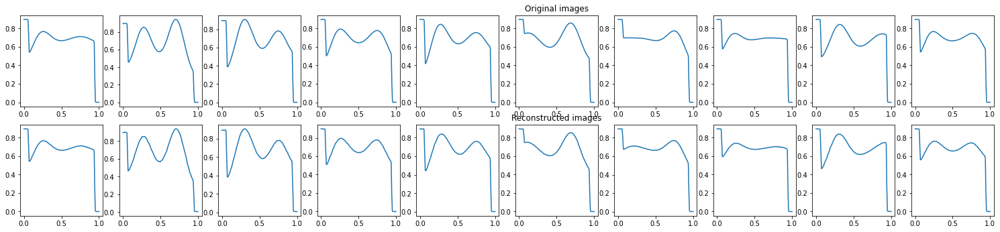

EPOCH 96/100 	 train loss 5.341083669918589e-05 	 val loss 6.54810355626978e-05


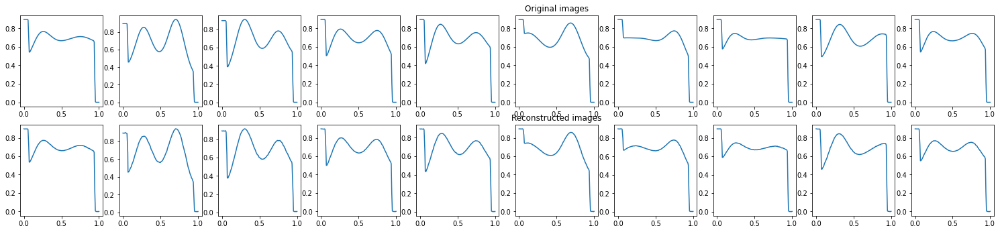

EPOCH 97/100 	 train loss 4.523815368884243e-05 	 val loss 5.255432552075945e-05


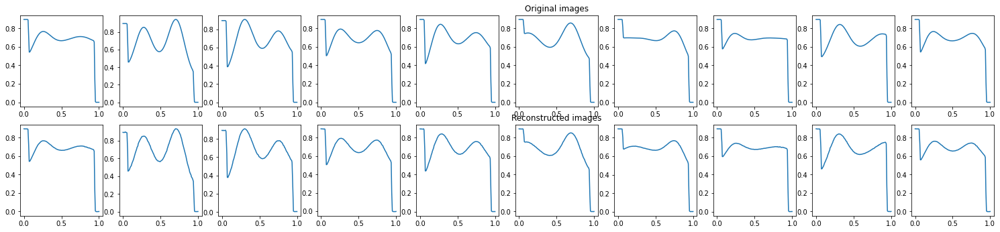

EPOCH 98/100 	 train loss 4.2152161768171936e-05 	 val loss 5.2343653806019574e-05


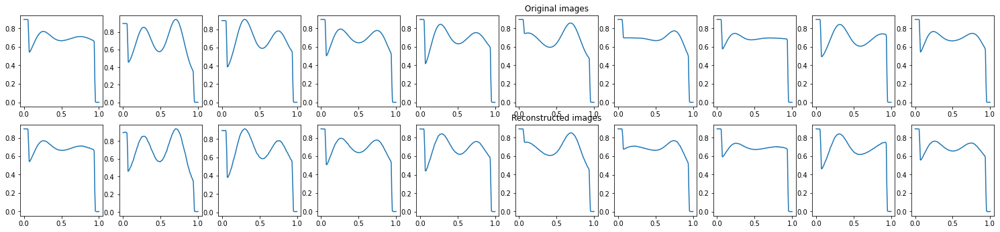

EPOCH 99/100 	 train loss 3.990492405137047e-05 	 val loss 5.235695789451711e-05


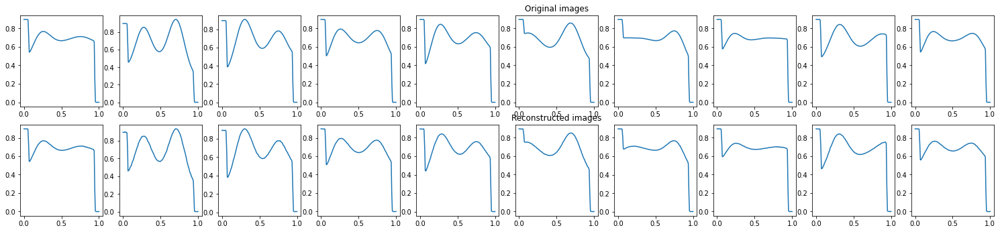

EPOCH 100/100 	 train loss 3.8415448216255754e-05 	 val loss 4.9523223424330354e-05


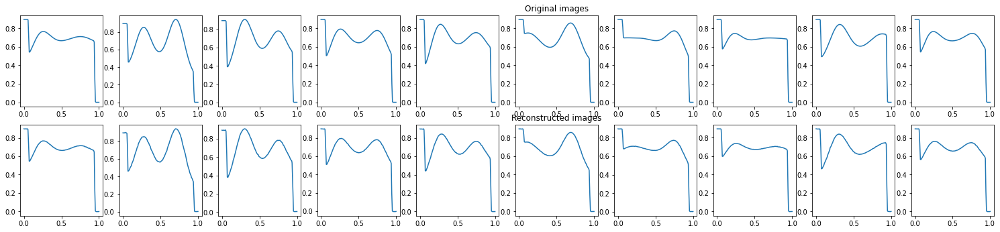

In [56]:
num_epochs = 100
diz_loss = {'train_loss':[],'val_loss':[]}
for epoch in range(num_epochs):
  # print (epoch)
  train_loss = train_epoch(model,device,train_loader,loss_fn,optim)
  val_loss = test_epoch(model,device,valid_loader,loss_fn)
  print('EPOCH {}/{} \t train loss {} \t val loss {}'.format(epoch + 1, num_epochs,train_loss,val_loss))
  diz_loss['train_loss'].append(train_loss)
  diz_loss['val_loss'].append(val_loss)
  plot_ae_outputs(model,xtrain_dataset,device,n=10)

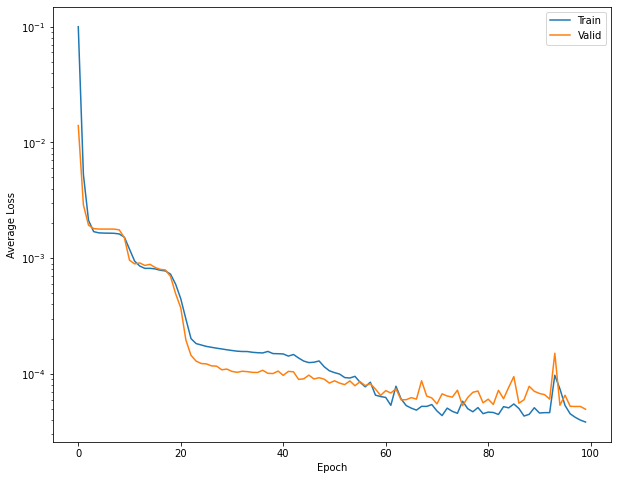

In [57]:
# Plot losses
plt.figure(figsize=(10,8))
plt.semilogy(diz_loss['train_loss'], label='Train')
plt.semilogy(diz_loss['val_loss'], label='Valid')
plt.xlabel('Epoch')
plt.ylabel('Average Loss')
#plt.grid()
plt.legend()
#plt.title('loss')
plt.show()

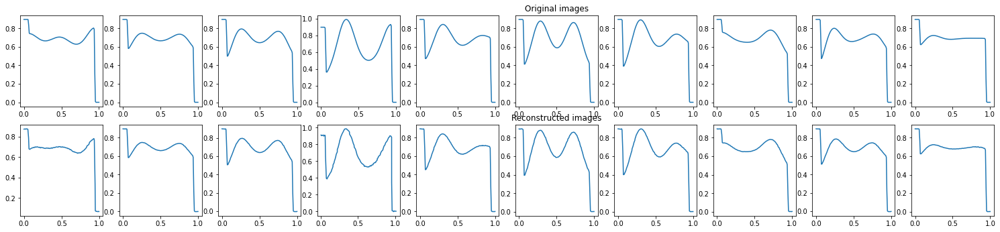

In [58]:
plot_ae_outputs(model,xtest_dataset,device,n=10)